# Foreword

This exercise was done for a Machine Learning and Pattern Recognition course in the University of Turku during winter 2023. This is not fully reprentative of my understanding and knowledge of Machine Learning as it has improved through additional courses on the Machine Learning (ML) but it does give a good glimpse of some of the topics corvered in the ML courses up to this point.

Oona Leppänen

# Introduction

There are two tasks in this report: compare three different machine learning methods to find out which of them performs best and compare the features of the rice species to find out which features perform best. The purposes of the tasks are to find out good features and a good model for sorting out rice species but also to learn visualization, model selection, performance estimation, etc.

The data used in this report includes three different rice species: Arborio, Basmati and Jasmine. The data originates from paper:
İ. Çınar and M. Koklu. Identification of rice varieties using machine learning algorithms. Journal of Agricultural Sciences, 28(2):307–325, 2022. doi: 10.15832/ankutbd.862482. https://dergipark.org.tr/en/download/article-file/1513632
The original data has more rice species than what is used here. The original data has 15000 images per rice specie but here only 100 image per rice specie is used so that the tasks could be completed on time using a laptop.

In this report Principal Component Analysis (PCA), K-Nearest Neighbors (kNN), Random Forest, Multilayer Perceptrons (MLP), Repeated k-fold Crossvalidation, k-fold Crossvalidation and Nested Crossvalidation were used. The report begins with importing the described data. Then contours are determined for each image using findContours() and drawContours() methods. From these images three example images are printed (one per specie). Then it is time to do some feature extraction. This part has been devided into Color feature extraction and Dimension feature extraction. pointPolygonTest() tells what pixels belong to the rice and what are just background. Using this information all feature extraction have been made. Color features are calculated for each RGB color channel. For Dimension features fitEllipse() method is used for fitting an ellipse onto a rice image for all images. Ellipses and contours are used to help determining the dimension features.

After feature extraction, data standardization has been done with z-score standardization. Histograms, boxplots and pairplots are created to visualize the data and PCA analysis has been done to understand the nature and the variance of the data better. In model selection 5-fold repeated cross validation with 3 repetitions has been used. It is carried out for kNN, MLP and Random Forest models with different hyperparameters. From Random Forest model the feature importancies are calculated. At the end, performance estimation has been done using nested cross validation with kNN, Random Forest and MLP. Outer CV is 10-fold cross validation and inner CV is 5-fold repeated cross validation with 3 repetitions as earlier. Accuracies and confusion matrixes are calculated for each best model.

The PCA analysis shows that the dataset can be described quite easily with only two components. However 10 components would be needed to cover 0.99 variance of the data. The best features for Random Forest were aspect ratio and roundness which are easily seen from the previos pairplot as well. What comes to performance estimation the mean accuracy of all best performed kNNs is about 0.980, the mean accuracy of all best performed Random Forests is 0.987 and the mean accuracy of all best performed MLPs is about 0.933. So the mean accuracies of all models were above 0.90 which is very good and Random Forest performed best. The model selection part agrees with the performance estimation part with th model selection accuracies being very close to the performance estimation accuracies.

# Part 1
Data preparation and feature extraction

## Import Packages

In [1]:
import numpy as np
import pandas as pd
import glob
import cv2
import operator

import random
from scipy import stats
import math

import matplotlib.pyplot as plt
import skimage
import seaborn as sns
import matplotlib.patches as mpatches

from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier as knnClassifier
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier as rfClassifier
from sklearn.neural_network import MLPClassifier

## Preparations of the Data

### Import Images
Here I import the images and take 100 random samples from among each rice species (300 images in total). Then I open all images and save them into rice species specific numpy arrays.

In [2]:
# Saves all images' data paths into species specific files.
arborio_files = glob.glob('../data/Arborio/*')
basmati_files = glob.glob('../data/Basmati/*')
jasmine_files = glob.glob('../data/Jasmine/*')

# Picks 100 random samples from each rice species
arborio_samples = random.sample(arborio_files, 100)
basmati_samples = random.sample(basmati_files, 100)
jasmine_samples = random.sample(jasmine_files, 100)



# Opens and saves all random arborio images into an array.
arborio = []

for file in arborio_samples:
    image = cv2.imread(file)
    arborio.append(image)
    
arborio = np.array(arborio)
    

# Opens and saves all random basmati images into an array.
basmati = []

for file in basmati_samples:
    image = cv2.imread(file)
    basmati.append(image)
    
basmati = np.array(basmati)
    

# Opens and saves all random jasmine images into an array.
jasmine = []

for file in jasmine_samples:
    image = cv2.imread(file)
    jasmine.append(image)
    
jasmine = np.array(jasmine)

In [3]:
# Copying the image arrays
arborio_2 = arborio.copy()
basmati_2 = basmati.copy()
jasmine_2 = jasmine.copy()

rice_contour_imgs = np.concatenate((arborio_2, basmati_2, jasmine_2), axis = 0) # Combining the arrays
rice_contour_imgs.shape # Printing the shape of the combined arrays

(300, 250, 250, 3)

### Determine the Contours
Draws contours on top of each image in each species. <br>
Source: https://docs.opencv.org/3.4/d4/d73/tutorial_py_contours_begin.html

In [4]:
contour_list = []

# Goes through all rice arrays.
#for specie in [arborio, basmati, jasmine]:
# Goes through all images in an rice array.
for image in rice_contour_imgs:
    imgray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Does grayscale
    ret, thresh = cv2.threshold(imgray, 127, 255, 0) # Sets the threshold for findContours method.
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) # Finds the contours.

    cv2.drawContours(image, contours, -1, (0,255,0), 3) # Draws the contours.
    contour_list.append(contours)

### Plot Example Images

I plot in a one plot three images - one image for each rice species. There are contours included in each image.

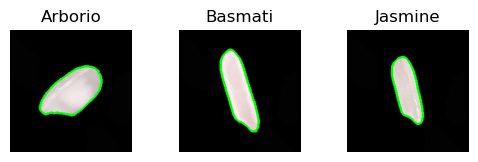

In [5]:
plt.figure(figsize = (5, 3))

# Plotting one image per rice specie.
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.tight_layout()
    plt.axis('off')
    
    # Image and its title depends on rice specie.
    if i == 0:
        image = rice_contour_imgs[0]
        plt.title('Arborio')
    elif i == 1:
        image = rice_contour_imgs[100]
        plt.title('Basmati')
    else:
        image = rice_contour_imgs[200]
        plt.title('Jasmine')
        
    plt.imshow(image, cmap="gray") # Shows image.

In [6]:
# Concatenating the numpy arrays into one
rice = np.concatenate((arborio, basmati, jasmine), axis = 0)
rice.shape

(300, 250, 250, 3)

## Feature Extraction

### Color Features
Calculating the color features using arrays. First looping through all the images. For each image do the following:

1. Finding out what points are inside the contours of an image.
2. If an point is in the image, the point is taken into an array for future color feature calculations.
3. Calculating color features
4. Saving color features into the feature array. The feature array consist of all calculated color features of all images and later all dimension features are added there as well.

Source for skewness and kurtosis: https://www.geeksforgeeks.org/how-to-calculate-skewness-and-kurtosis-in-python/

In [7]:
# An array for saving color features of one image so that the array can be used as a row when saving the features into 
# the features_arr array.
color_row = np.zeros(21)
features_arr = np.empty(shape = [0, 21]) # An empty array for saving all features from all images.

# Goes through all images
for k, image in enumerate(rice):
    in_contour = np.empty(shape = [0, 3]) # An empty array for points in contour.
    
    
    # Checks which points are inside an cotour of an image.
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            point = cv2.pointPolygonTest(contour_list[k][0], (j,i), False)
            
            # When point is inside the contour it is saved to the array.
            if point == 1:
                in_contour = np.append(in_contour, [image[i, j, :]], axis = 0)
                
                
    # Calculating and saving the color features into the row array.
    color_row[0:3] = np.mean(in_contour, axis = (0))
    color_row[3:6] = np.var(in_contour, axis = (0))
    color_row[6:9] = stats.skew(in_contour, axis = (0), bias = True)
    color_row[9:12] = stats.kurtosis(in_contour, axis = (0), bias = True)
    color_row[12:15] = skimage.measure.shannon_entropy(in_contour)

    features_arr = np.append(features_arr, [color_row], axis = 0) # Appending the color feature row array into the feature array.

### Dimension Features

1. Fits an ellipse into all images.
2. Shows three examples - one for each rice specie class.
3. Calculates all the dimension features and saves them into the feature array where all color features are as well.

Source for making ellipse, minor and mayor length: https://stackoverflow.com/questions/62698756/opencv-calculating-orientation-angle-of-major-and-minor-axis-of-ellipse <br>
Source for roundness: https://stackoverflow.com/questions/29814229/how-to-calculate-the-value-of-the-roundness-shape-feature-of-an-image-contour <br>

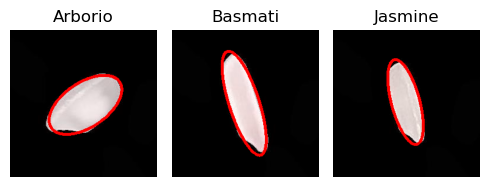

In [8]:
plt.figure(figsize = (5, 3))
i = 1

# Goes through all images.
for k in range(len(rice)):
    # Making and fitting ellipse.
    ellipse = cv2.fitEllipse(contour_list[k][0])
    cv2.ellipse(rice[k], ellipse, (255, 0, 0), 3)

    
    plt.subplot(1, 3, i)
    plt.tight_layout()
    plt.axis('off')

    # Printing an example image of each rice species.
    if k == 0:
        plt.title('Arborio')
        plt.imshow(rice[k], cmap="gray")
        i = 2
    elif k == 100:
        plt.title('Basmati')
        plt.imshow(rice[k], cmap="gray")
        i = 3
    elif k == 200:
        plt.title('Jasmine')
        plt.imshow(rice[k], cmap="gray")
        
        
    # Calculating and saving the dimension features to the features numpy array.
    (features_arr[k][15], features_arr[k][16]) = ellipse[1] # minor and mayor axis lengths
    features_arr[k][17] = cv2.contourArea(contour_list[k][0]) # Area
    features_arr[k][18] = cv2.arcLength(contour_list[k][0], True) # Perimeter of the contour.
    features_arr[k][19] = 4 * math.pi * features_arr[k][17] / (features_arr[k][18]**2) # Roundness
    features_arr[k][20] = features_arr[k][16]/features_arr[k][15] # Aspect ratio

### Gathering and Saving All the Data

Creates a dataframe which contains the file path of each image, rice specie of each image and all features, respectively.

Source for concatenating array matrix and dataframe: https://www.statology.org/add-numpy-array-to-pandas-dataframe/



In [9]:
# Concatenates all image file paths to one array.
paths_to_images = np.concatenate((arborio_samples, basmati_samples, jasmine_samples), axis = 0)
        
# Makes an array and appends rice species data of all images to the array.
specie_names = []
for i in range(len(paths_to_images)):
    if i < 100:
        specie_names.append('Arborio')
    elif (i >= 100) & (i < 200):
        specie_names.append('Basmati')
    else:
        specie_names.append('Jasmine')
    
    
# Creates a dataframe containing image file paths and rice specie names.
rice_df= pd.DataFrame({'Image_path': paths_to_images, 'Rice_specie': specie_names}, columns = ['Image_path', 'Rice_specie'])
# Converts feature array to a dataframe.
features_df = pd.DataFrame(features_arr, columns = ['Mean_B','Mean_G', 'Mean_R', 'Variance_B', 'Variance_G', 'Variance_R', 
                                                    'Skewness_B', 'Skewness_G', 'Skewness_R', 'Kurtosis_B', 'Kurtosis_G', 
                                                    'Kurtosis_R', 'Entropy_B', 'Entropy_G', 'Entropy_R', 'Mayor_Length', 
                                                    'Minor_Length', 'Area', 'Perimeter', 'Roundness', 
                                                    'Aspect_ratio'])

rice_df = pd.concat([rice_df, features_df], axis = 1) # Concatenates the two above dataframes into final one.

In [10]:
# Saving the dataframe into a csv file.
rice_df.to_csv('../training_data/rice_data.csv', index = False)

# Part 2
Data exploration and model selection

## Data Exploration

### Data Standardization

In [11]:
# Data standardization with z-score
rice_df_st = (rice_df.iloc[:, 2:] - rice_df.iloc[:, 2:].mean()) / (rice_df.iloc[:, 2:].std())
rice_df_st = pd.concat([rice_df.iloc[:, :2], rice_df_st], axis = 1)
rice_df_st[:5]

,Image_path,Rice_specie,Mean_B,Mean_G,Mean_R,Variance_B,Variance_G,Variance_R,Skewness_B,Skewness_G,...,Kurtosis_R,Entropy_B,Entropy_G,Entropy_R,Mayor_Length,Minor_Length,Area,Perimeter,Roundness,Aspect_ratio
0,../data/Arborio\Arborio (11598).jpg,Arborio,-0.705892,-0.734502,-0.433342,1.122469,0.371353,0.318393,0.015105,-0.483150,...,-0.602596,0.745795,0.745795,0.745795,1.687003,-0.848500,0.830003,-0.256469,1.216009,-1.272515
1,../data/Arborio\Arborio (2419).jpg,Arborio,-0.390094,0.180239,0.568977,2.523502,2.409705,2.380483,-0.116021,-0.647867,...,-0.749745,1.241551,1.241551,1.241551,0.983006,-0.886730,0.172987,-0.602043,1.099848,-1.077029
2,../data/Arborio\Arborio (3928).jpg,Arborio,-0.987688,-0.490441,-0.221206,1.282260,0.936760,0.881984,-0.345576,-0.816230,...,-0.588897,0.154288,0.154288,0.154288,1.286396,-1.361598,-0.193853,-1.138410,1.727612,-1.386910
3,../data/Arborio\Arborio (3807).jpg,Arborio,-0.638327,-0.173178,0.119107,2.485657,1.601953,1.561650,-0.270686,-0.945433,...,-0.529451,0.841493,0.841493,0.841493,0.982625,-1.123747,-0.131519,-0.935977,1.373809,-1.188654
4,../data/Arborio\Arborio (12576).jpg,Arborio,-1.374145,-0.982563,-0.562134,1.122724,0.659025,0.715788,0.435146,-0.109342,...,-0.978966,0.242536,0.242536,0.242536,1.338204,-0.896128,0.519766,-0.627507,1.575533,-1.194020


### Plots

#### Boxplots

Text(0.5, 1.0, 'All feature boxplots')

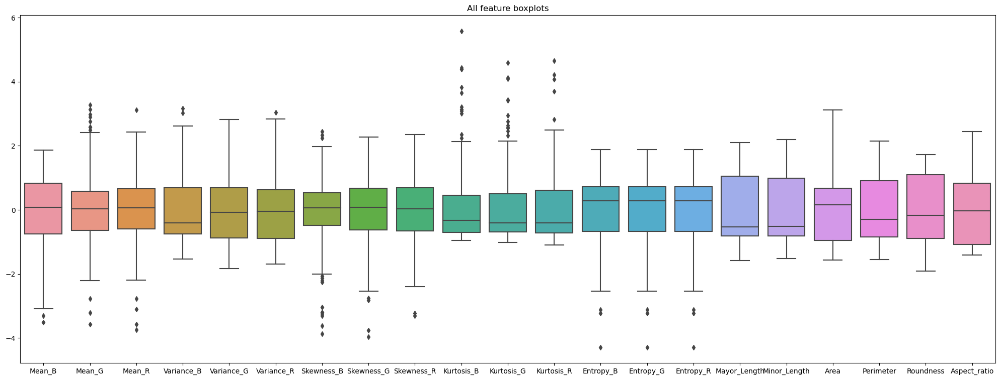

In [12]:
plt.figure(figsize = (25, 9))
sns.boxplot(data = rice_df_st.iloc[:, 2:])
plt.title('All feature boxplots')

#### Histograms

Text(0.5, 1.0, 'All feature histograms')

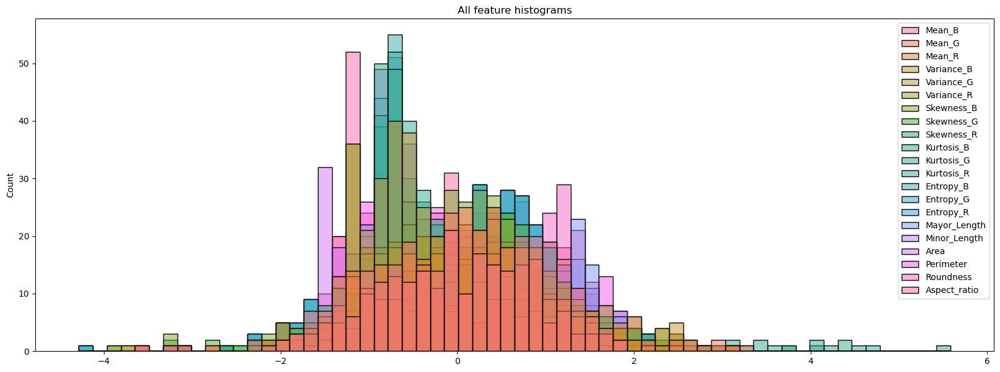

In [13]:
plt.figure(figsize = (20, 7))
sns.histplot(rice_df_st)
plt.title('All feature histograms')

#### Pairplots

Source for plt.rc: https://stackoverflow.com/questions/3899980/how-to-change-the-font-size-on-a-matplotlib-plot <br>

Text(0.5, 1.005, 'All features against all features')

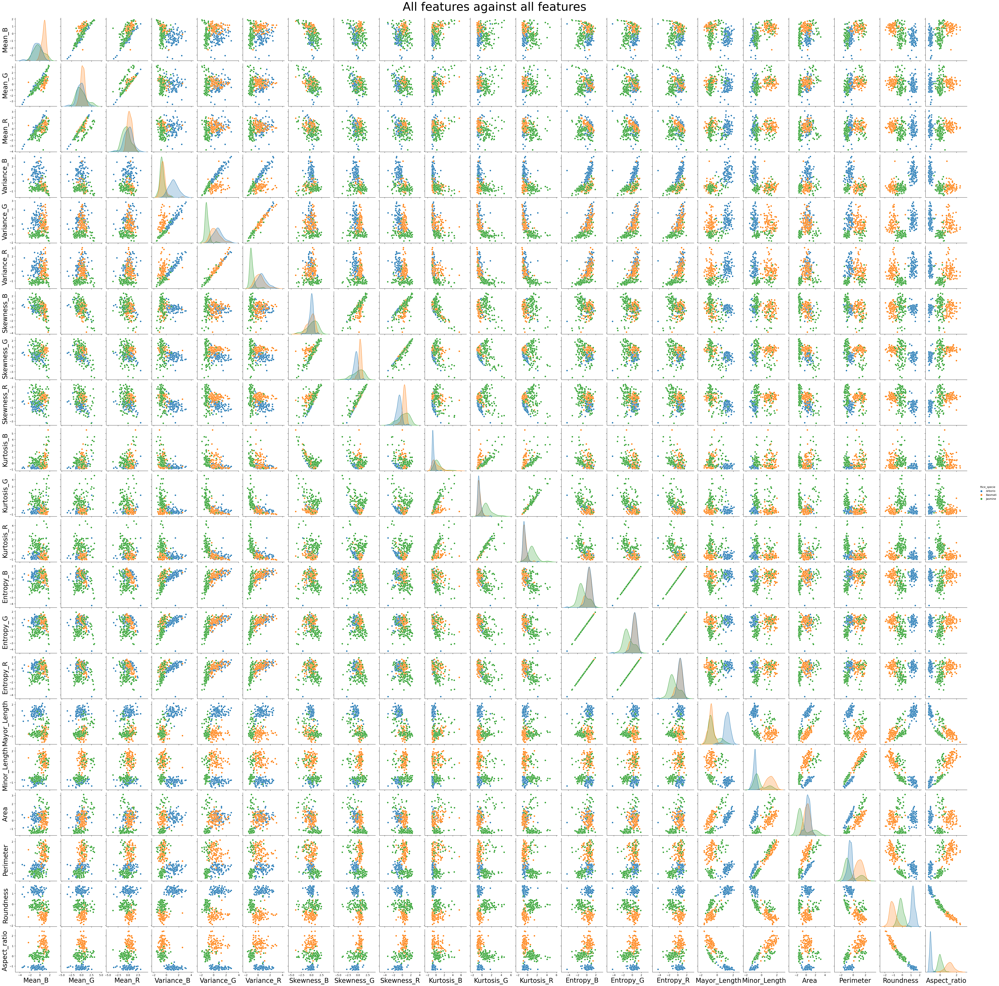

In [14]:
plt.rc('axes', labelsize = 25)

pair_1 = sns.pairplot(rice_df_st, hue = 'Rice_specie')
pair_1.fig.suptitle('All features against all features', y = 1.005, fontsize = 45)

Text(0.5, 1.3, 'Labels against all features')

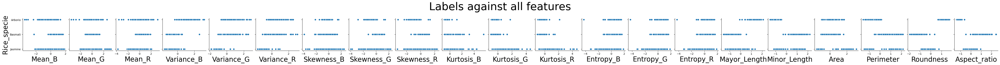

In [15]:
pair_2 = sns.pairplot(rice_df_st, y_vars = ['Rice_specie'])
pair_2.fig.suptitle('Labels against all features', y = 1.3, fontsize = 40)

### Discussion about the Plots

**Discuss your findings from the above figures, e.g. can you spot features which might be very useful in predicting the correct class?**

My findings depend on the run at least somewhat. That's because I chose to include the Part 1 into this notebook file and therefore the code always chooses new rice specie examples in every run. But mo ofly the findings can bgeneralizedal.

From the feature against feature pair weplotn beseen that the color features are not very useful for class prediction. The dimension features are looking much better in the sense of useful features. The different classes stand out quite easily from the dimensional feature against dimensional feature plots. Nevertheless, the round and aspect rationess feasture sepawell the cla quite wellther regard ofless what the other fea they are paired withe plot.

From the boxplots and histograms can be seere are some  existoutliers (count depends on tbutrun) and that the variables don't vary much from eah others.

### PCA

Source for PCA fitting: https://www.jcchouinard.com/pca-with-python/ <br>
Source for PCA variance: https://stackoverflow.com/questions/32857029/python-scikit-learn-pca-explained-variance-ratio-cutoff

Text(0.5, 1.0, 'PCA with two components')

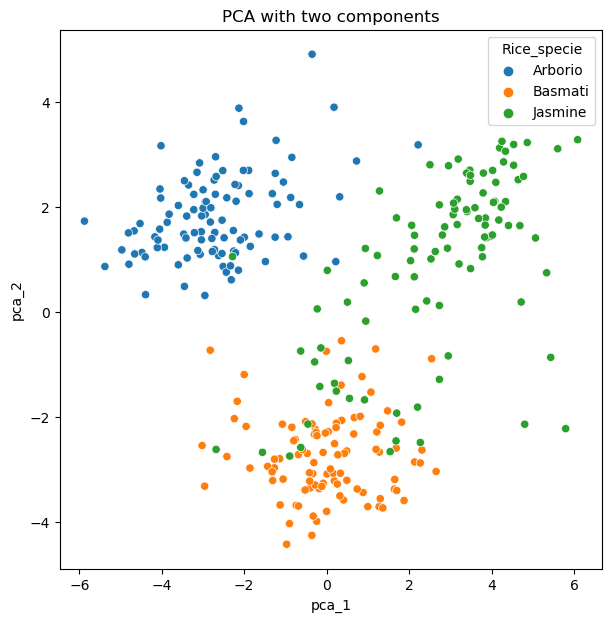

In [16]:
# Calculating PCA
pca = PCA(n_components = 2)
pca_components = pd.DataFrame(pca.fit_transform(rice_df_st.iloc[:, 2:]), columns = ['pca_1', 'pca_2'])
pca_features = pd.concat([pca_components, rice_df_st.iloc[:, 1]], axis = 1)

# Plotting PCA
plt.figure(figsize = (7, 7))
plt.rc('axes', labelsize = 10)
sns.scatterplot(data = pca_features, x = 'pca_1', y = 'pca_2', hue = 'Rice_specie')
plt.title('PCA with two components')

**Can you see any clusters in PCA? Does this figure give you any clues, how well you will be able to classify the image types? Explain.**

The clusters are not perfect but they can be seen very easily. Arborio is on the uleftht corner, basmati iaton the botter and the jasmine is on the urightft corner. Because the species have their own areas and the areas don't overlap much with each other, clustering should give quite a good result. Especially the Arborio class should be very easy to divide from each other class. Basmati and Jasmine are a bit harder but they should do well enough.

#### How many PCA components are needed to cover 99% of the variance?

In [17]:
# Calculating PCA with 99% variance
pca_variance099 = PCA(n_components = 0.99)
pca_components_var = pca_variance099.fit_transform(rice_df_st.iloc[:, 2:])
variances = pca_variance099.explained_variance_ratio_.cumsum() # Calculating number of components

print('Variances (1 comp, 2 comps, etc.)')
print(variances)
print('\nNumber of components needed:', len(variances))

Variances (1 comp, 2 comps, etc.)
[0.33653683 0.5884806  0.78311884 0.86470633 0.90882431 0.93717176
 0.95910698 0.97721038 0.98609266 0.99220953]

Number of components needed: 10


## Model Selection

### Changes specie names  to numbers

In [18]:
# Changes all 'Arborio' specie names to number 0, all 'Basmati' specie names to number 1 and 
# all 'Jasmine' specie names to number 2 in rice_df_st dataframe.

for i in range(len(rice_df_st)):
    if rice_df_st.loc[i, 'Rice_specie'] == 'Arborio':
        rice_df_st.loc[i, 'Rice_specie'] = 0
    elif rice_df_st.loc[i, 'Rice_specie'] == 'Basmati':
        rice_df_st.loc[i, 'Rice_specie'] = 1
    elif rice_df_st.loc[i, 'Rice_specie'] == 'Jasmine':
        rice_df_st.loc[i, 'Rice_specie'] = 2

rice_df_st['Rice_specie'] = rice_df_st['Rice_specie'].astype('category')
print(rice_df_st['Rice_specie'])

0      0
1      0
2      0
3      0
4      0
      ..
295    2
296    2
297    2
298    2
299    2
Name: Rice_specie, Length: 300, dtype: category
Categories (3, int64): [0, 1, 2]


### kNN

Training kNN model with different k values (1-20). Creating dataframe where are all accuracies with corresponding hyperparameter values.

Source for kNN: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html <br>
Source for repeated k-fold CV: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RepeatedKFold.html

In [19]:
rkfold = RepeatedKFold(n_splits = 5, n_repeats = 3) # 5-fold repeated CV with 3 repetitions
knn_acc = pd.DataFrame(columns = ['k', 'Accuracy']) # Dataframe for all hyperparameters and their accuracies.

# kNN
for i in range(1, 21):
    knn = knnClassifier(n_neighbors = i)
    acc_list = [] # List for all accuracies of one k value.
    
    # repeated k-fold CV data split, kNN training and predicting, accuracy calculation
    for train_idx, test_idx in rkfold.split(rice_df_st):
        knn_train_data = rice_df_st.loc[train_idx]
        knn_test_data = rice_df_st.loc[test_idx]
        knn_train_labels = knn_train_data.loc[:]['Rice_specie']
        knn_test_labels = knn_test_data.loc[:]['Rice_specie']
        
        knn.fit(knn_train_data.iloc[:, 2:], knn_train_labels)
        knn_prediction = knn.predict(knn_test_data.iloc[:, 2:])
        
        # Calculates the accuracy of one iteration with k = i and specific data split
        knn_accuracy = knn.score(knn_test_data.iloc[:, 2:], knn_test_labels)
        acc_list.append(knn_accuracy)
        
    acc_mean = np.mean(acc_list) # Mean accuracy of one iteration.
    # Adds a row into kNN accuracy dataframe (hyperparameter and accuracy)
    knn_acc = pd.concat([knn_acc, pd.DataFrame.from_records([{'k': i, 'Accuracy' : acc_mean}])], axis = 0, ignore_index = True)
    
print(knn_acc)

     k  Accuracy
0    1  0.975556
1    2  0.971111
2    3  0.975556
3    4  0.967778
4    5  0.968889
5    6  0.965556
6    7  0.964444
7    8  0.961111
8    9  0.961111
9   10  0.961111
10  11  0.956667
11  12  0.957778
12  13  0.955556
13  14  0.953333
14  15  0.957778
15  16  0.955556
16  17  0.956667
17  18  0.953333
18  19  0.950000
19  20  0.945556


#### The Max Accuracy and It's Hyperparameter in kNN

In [20]:
max_acc_row_knn = knn_acc.loc[knn_acc['Accuracy'].idxmax()]
print('Max accuracy row:\n', max_acc_row_knn) # Gives the row where the max accuracy is.

Max accuracy row:
 k                  3
Accuracy    0.975556
Name: 2, dtype: object


#### Plotting kNN

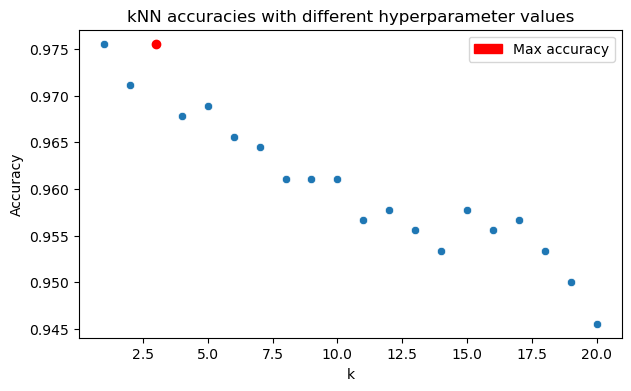

In [21]:
plt.figure(figsize = (7, 4))
ax = sns.scatterplot(data = knn_acc, x = 'k', y = 'Accuracy')
ax.set_title('kNN accuracies with different hyperparameter values')

ymax = max_acc_row_knn[1] # Max accuracy
xmax = max_acc_row_knn[0] # k when max accuracy

plt.scatter(xmax, ymax, color='r')
red_patch = mpatches.Patch(color='red', label='Max accuracy')
ax.legend(handles=[red_patch])

### Random Forest

Training Random Forest model with different max depth (5-17) and max feature values (1-21). Creating dataframe where are all accuracies with corresponding hyperparameter values.

Source for Random Forest: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

In [22]:
# Dataframe for all hyperparameters and their accuracies.
rf_acc = pd.DataFrame(columns = ['Max_depth', 'Max_features', 'Accuracy'])
rkfold = RepeatedKFold(n_splits = 5, n_repeats = 3) # 5-fold repeated CV with 3 repetitions

# Random Forest
for i in range(5, 18):
    for j in range(1, 22): # number 22 depends on the dataframe used
        rf = rfClassifier(max_depth = i, max_features = j)
        acc_list = [] # List for all accuracies of one max depth and one max features values.
    
        # repeated k-fold CV data split, Random Forest training and predicting, accuracy calculation
        for train_idx, test_idx in rkfold.split(rice_df_st):
            rf_train_data = rice_df_st.loc[train_idx]
            rf_test_data = rice_df_st.loc[test_idx]
            rf_train_labels = rf_train_data.loc[:]['Rice_specie']
            rf_test_labels = rf_test_data.loc[:]['Rice_specie']

            rf.fit(rf_train_data.iloc[:, 2:], rf_train_labels)
            rf_prediction = rf.predict(rf_test_data.iloc[:, 2:])
            
            # Calculates the accuracy of one iteration with specific data split and specific hyperparameter values.
            rf_accuracy = rf.score(rf_test_data.iloc[:, 2:], rf_test_labels)
            acc_list.append(rf_accuracy)

        acc_mean = np.mean(acc_list) # Mean accuracy of one iteration.
        # Adds a row into Random Forest accuracy dataframe (hyperparameters and accuracy)
        rf_acc = pd.concat([rf_acc, pd.DataFrame.from_records([{'Max_depth': i, 'Max_features' : j, 'Accuracy' : acc_mean}])], 
                           axis = 0, ignore_index = True)
    
print(rf_acc)

    Max_depth Max_features  Accuracy
0           5            1  0.977778
1           5            2  0.984444
2           5            3  0.981111
3           5            4  0.982222
4           5            5  0.974444
..        ...          ...       ...
268        17           17  0.966667
269        17           18  0.966667
270        17           19  0.964444
271        17           20  0.967778
272        17           21  0.967778

[273 rows x 3 columns]


#### The Max Accuracy and It's Hyperparameters in Random Forest

In [23]:
max_acc_row_rf = rf_acc.loc[rf_acc['Accuracy'].idxmax()]
print('Max accuracy row:\n', max_acc_row_rf) # Gives the row where the max accuracy is.

Max accuracy row:
 Max_depth              5
Max_features           2
Accuracy        0.984444
Name: 1, dtype: object


#### Plotting Random Forest

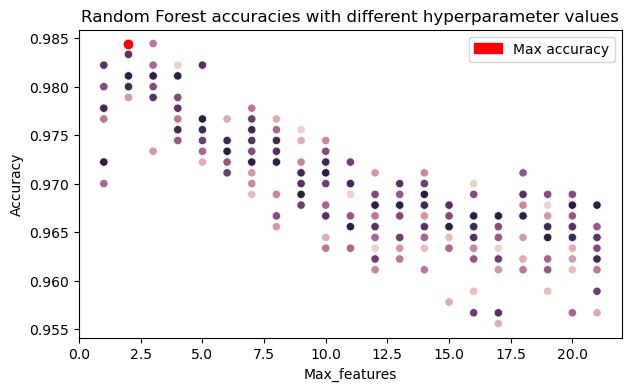

In [24]:
plt.figure(figsize = (7, 4))
ax = sns.scatterplot(data = rf_acc, x = 'Max_features', y = 'Accuracy', hue = 'Max_depth')
ax.set_title('Random Forest accuracies with different hyperparameter values')

ymax = max_acc_row_rf[2] # Max accuracy
xmax = max_acc_row_rf[1] # Max features when max accuracy

# Marking max accuracy
plt.scatter(xmax, ymax, color='r')
red_patch = mpatches.Patch(color='red', label='Max accuracy')
ax.legend(handles=[red_patch])

#### Feature Importance

Source for sorting: https://stackoverflow.com/questions/7197315/5-maximum-values-in-a-python-dictionary

In [25]:
print('Random Forest feature importance\n', rf.feature_importances_, '\n')

important_features_dict = {}
for idx, val in enumerate(rf.feature_importances_):
    important_features_dict[idx] = val

important_features = dict(sorted(important_features_dict.items(), key=operator.itemgetter(1), reverse=True)[:5])

print(f'5 most important features and their values:\n {important_features}')

Random Forest feature importance
 [0.00093892 0.00141168 0.00344768 0.00074484 0.0611713  0.05627425
 0.0007072  0.00228757 0.00230203 0.00151432 0.06172416 0.02264973
 0.00064842 0.00056921 0.00069953 0.0046239  0.00249131 0.0050552
 0.00341699 0.29900734 0.46831442] 

5 most important features and their values:
 {20: 0.4683144189332581, 19: 0.29900734113800853, 10: 0.06172416437629069, 4: 0.061171301437543554, 5: 0.05627424909872165}


**For random forest model, report the feature importance for each feature. Which features seem to be the most important? Does this correspond with the observations you made in the data exploration?** <br>

The most important features are roundness and aspect ratio. <br>
The roundness and aspect ratio are the most important features by far. I made the same observations in Data exploration section.

### MLP

Training MLP model with different number of neurons (1-20), activation function ('relu' / 'logistic'), solver ('adam' / 'sgd') and validation fraction (0.1 / 0.5). Creating dataframe where are all accuracies with corresponding hyperparameter values. <br>
The point of variable hyperparams is simplifying the hyperparameter values to make it easier to create plots. The numbers cycle from 0 to 7 where each number means specific hyperparameter values. The cycle can be found from the for loops below. Number 0 means hyperparameter values 'relu', 'adam' and 0.1, number 1 is 'relu', 'adam' and 0.5, number 2 is 'relu', 'sgd' and 0.1 and so on. When reached number 7 and corresponding values 'logistic', 'sgd' and 0.5, the cycle begins from the beginning and the number of neurons changes.

Source for MLP: https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html

In [26]:
rkfold = RepeatedKFold(n_splits = 5, n_repeats = 3) # 5-fold repeated CV with 3 repetitions
# Dataframe for all hyperparameters and their accuracies.
mlp_acc = pd.DataFrame(columns = ['Nb_neurons', 'Activation_function', 'Solver', 'Validation_fraction', 'Accuracy'])

# MLP
for n in range(1, 21): # number of neurons
    hyperparams = 0 # Collects Activation_function, Solver and Validation_fraction hyperparameters in one parameter.
    for af in ['relu', 'logistic']: # Activation function
        for s in ['adam', 'sgd']: # Solver
            for vf in [0.1, 0.5]: # Validation fraction
                mlp = MLPClassifier(hidden_layer_sizes = (n,), activation = af, solver = s, validation_fraction = vf,
                                    early_stopping = True, max_iter = 400)
                acc_list = [] # List for all accuracies of specific hyperparameters.
                
                # repeated k-fold CV data split, MLP training and predicting, accuracy calculation
                for train_idx, test_idx in rkfold.split(rice_df_st):
                    mlp_train_data = rice_df_st.loc[train_idx]
                    mlp_test_data = rice_df_st.loc[test_idx]
                    mlp_train_labels = mlp_train_data.loc[:]['Rice_specie']
                    mlp_test_labels = mlp_test_data.loc[:]['Rice_specie']

                    mlp.fit(mlp_train_data.iloc[:, 2:].values, mlp_train_labels.values)
                    mlp_prediction = mlp.predict(mlp_test_data.iloc[:, 2:].values)

                    # Calculates the accuracy of one iteration with specific data split and specific hyperparameter values.
                    mlp_accuracy = mlp.score(mlp_test_data.iloc[:, 2:].values, mlp_test_labels.values)
                    acc_list.append(mlp_accuracy)

                acc_mean = np.mean(acc_list) # Mean accuracy of one iteration.
                # Adds a row into MLP accuracy dataframe (hyperparameters and accuracy)
                mlp_acc = pd.concat([mlp_acc, pd.DataFrame.from_records([{'Nb_neurons': n, 'Activation_function' : af, 
                                                                          'Solver' : s, 'Validation_fraction' : vf, 
                                                                          'Accuracy' : acc_mean, 
                                                                          'Hyperparameters' : hyperparams}])], 
                                    axis = 0, ignore_index = True)
                hyperparams += 1
        
print(mlp_acc[:5])

  Nb_neurons Activation_function Solver  Validation_fraction  Accuracy  \
0          1                relu   adam                  0.1  0.307778   
1          1                relu   adam                  0.5  0.365556   
2          1                relu    sgd                  0.1  0.442222   
3          1                relu    sgd                  0.5  0.412222   
4          1            logistic   adam                  0.1  0.340000   

   Hyperparameters  
0              0.0  
1              1.0  
2              2.0  
3              3.0  
4              4.0  


#### The max accuracy and it's hyperparameters in MLP

In [27]:
mlp_acc['Hyperparameters'] = mlp_acc['Hyperparameters'].astype('category') # Changing hyperparam values from int to categorical.

max_acc_row_MLP = mlp_acc.loc[mlp_acc['Accuracy'].idxmax()]
print('Max accuracy row:\n', max_acc_row_MLP) # Gives the row where the max accuracy is.

Max accuracy row:
 Nb_neurons                   17
Activation_function        relu
Solver                     adam
Validation_fraction         0.5
Accuracy               0.914444
Hyperparameters             1.0
Name: 129, dtype: object


#### Plotting MLP

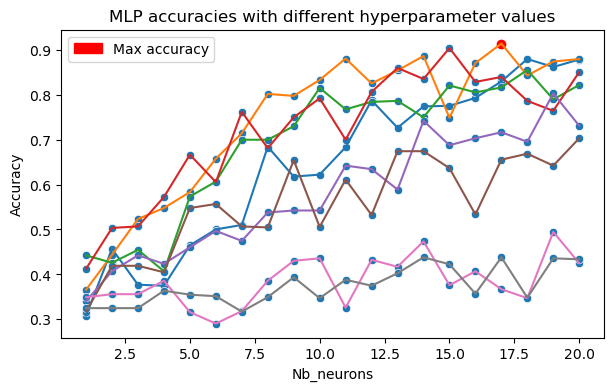

In [28]:
plt.figure(figsize = (7, 4))
ax = sns.scatterplot(data = mlp_acc, x = 'Nb_neurons', y = 'Accuracy') # Creates blue points to the plot.
sns.lineplot(data = mlp_acc, x = 'Nb_neurons', y = 'Accuracy', hue = 'Hyperparameters') # Creates lines to the plot.
ax.set_title('MLP accuracies with different hyperparameter values')

ymax = max_acc_row_MLP[4] # Max accuracy
xmax = max_acc_row_MLP[0] # Number of neurons when max accuracy 

# Marking max accuracy
plt.scatter(xmax, ymax, color='r')
red_patch = mpatches.Patch(color='red', label='Max accuracy')
ax.legend(handles=[red_patch])

plt.show()

### Model Selection Thoughts

**Ponder the model selection process. What things should be considered when selecting the model to be used?**

What comes to this project at least computational time, hyperparameter choices, performance and data size should be considered. Random forest took very much time to run while the other models were quite fast. Although the performance of Random forest was the best (about 0.984), the kNN was very close to it (about 0.976). MLP didn't do that well but still got a very good performance (about 0.914). Regardless the very good performance of the models (especially kNN and Random Forest) I don't trully trust them. It doesn't seem right that the performances could do <99% accuracy without something being wrong or forgotten. The data size is way too small and that's very likely at least one reason what comes to the high performances and that the MLP was the worst model. With much much larger data set the MLP would have been more succesful. On the other hand kNN would have taken much more time that it took now and I don't want to even start to think about the time Random Forest would have taken. The hyperparameters should be also chosen very carefully. While in kNN and MLP different hyperparameters can be quite easily tested in Random Forest that's not the case anymore because of the long running time.

# Part 3

## Performance Estimation

- Uses the previously gathered data (the standardized features). <br>
- Estimates the performance of each model using nested cross validation. Uses 10-fold cross validation for outer and
5-fold repeated cross validation with 3 repetitions for inner loop.  <br> 
- Selects the best model in the inner loop using the hyperparameter combinations and ranges defined in the Part 2. <br>
- For each model, calculates the accuracy and the confusion matrix.
- Prints the hyperparameter/hyperparameter combination that is most often chosen as the best one for each classifier

### Performance Estimation of kNN

- 10-fold CV
    - Trying different kNN parameters
        - Repeated 5-fold CV
            - Training
            - Accuracy
        - Selection of the best model
    - Saving the parameters of the best model
    - Training,
    - accuracy,
    - prediction and 
    - confusion matrix of the best model
- Printing best parameter combinations and their frequency

Source for confusion matrix: https://www.jcchouinard.com/confusion-matrix-in-scikit-learn/ <br>
Source for idxmax(): https://www.geeksforgeeks.org/find-maximum-values-position-in-columns-and-rows-of-a-dataframe-in-pandas/

In [29]:
kfold = KFold(n_splits = 10, shuffle = True) # 10-fold CV
rkfold = RepeatedKFold(n_splits = 5, n_repeats = 3) # 5-fold repeated CV with 3 repetitions

# Dataframe for checking the most often chosen classifier
d = {'k': [i for i in range(1, 21)], 'Counter': [0]*20}
knn_param_counter = pd.DataFrame(data = d)

best_model_param = 0
knn_best_model_acc_list = [] # For calculating mean


# 10-fold CV
for train_idx, test_idx in kfold.split(rice_df_st):
    best_model_acc = 0
    
    # kNN
    for k in range(1, 21):
        knn = knnClassifier(n_neighbors = k)
        acc_list = [] # List for all accuracies of specific k value.
        
        # Repeated k-fold CV data split, kNN training and predicting, accuracy calculation
        for train_idx_2, valid_idx in rkfold.split(rice_df_st.loc[train_idx]):
            knn_train_data = rice_df_st.loc[train_idx_2]
            knn_test_data = rice_df_st.loc[valid_idx]
            knn_train_labels = knn_train_data.loc[:]['Rice_specie']
            knn_test_labels = knn_test_data.loc[:]['Rice_specie']

            knn.fit(knn_train_data.iloc[:, 2:], knn_train_labels)

            # Calculates the accuracy of one iteration with k and specific data split
            knn_accuracy = knn.score(knn_test_data.iloc[:, 2:], knn_test_labels)
            acc_list.append(knn_accuracy)
        
        acc_mean = np.mean(acc_list) # Mean accuracy of one iteration.
        # Checks is the model best so far and if it is then saves the parameters of the model.
        if acc_mean > best_model_acc:
            best_model_acc = acc_mean
            best_model_param = k
    
    # Keeps count of the duplicate k values saving the count into a dataframe.
    knn_param_counter.iloc[knn_param_counter[knn_param_counter['k'] == best_model_param].index, 1] += 1
    
    # Training, prediction, accuracy and confusion matrix of the best model:
    
    knn = knnClassifier(n_neighbors = best_model_param)
    knn_train_data = rice_df_st.loc[train_idx]
    knn_test_data = rice_df_st.loc[test_idx]
    knn_train_labels = knn_train_data.loc[:]['Rice_specie']
    knn_test_labels = knn_test_data.loc[:]['Rice_specie']

    knn.fit(knn_train_data.iloc[:, 2:], knn_train_labels)
    knn_prediction = knn.predict(knn_test_data.iloc[:, 2:])

    knn_accuracy = knn.score(knn_test_data.iloc[:, 2:], knn_test_labels)
    knn_best_model_acc_list.append(knn_accuracy)
    print('k: ', best_model_param, ', acc: ', knn_accuracy)
    print('Inner loop accuracy: ', best_model_acc)
    
    con_matrix = confusion_matrix(knn_test_labels, knn_prediction)
    print(con_matrix, '\n')
    
    
print(knn_param_counter.iloc[knn_param_counter['Counter'].idxmax()], '\n') # Most often chosen parameter with its count.
print(knn_param_counter) # All values of k with count.

k:  1 , acc:  0.9666666666666667
Inner loop accuracy:  0.9728395061728394
[[10  0  0]
 [ 0  8  0]
 [ 0  1 11]] 

k:  1 , acc:  0.9666666666666667
Inner loop accuracy:  0.9777777777777779
[[ 8  0  0]
 [ 0 13  0]
 [ 1  0  8]] 

k:  1 , acc:  1.0
Inner loop accuracy:  0.9777777777777779
[[12  0  0]
 [ 0 10  0]
 [ 0  0  8]] 

k:  1 , acc:  0.9666666666666667
Inner loop accuracy:  0.980246913580247
[[12  0  1]
 [ 0  8  0]
 [ 0  0  9]] 

k:  1 , acc:  1.0
Inner loop accuracy:  0.974074074074074
[[ 6  0  0]
 [ 0  8  0]
 [ 0  0 16]] 

k:  1 , acc:  0.9666666666666667
Inner loop accuracy:  0.974074074074074
[[ 8  0  0]
 [ 0 11  0]
 [ 0  1 10]] 

k:  1 , acc:  0.9666666666666667
Inner loop accuracy:  0.9765432098765433
[[ 9  0  0]
 [ 0 10  0]
 [ 0  1 10]] 

k:  1 , acc:  0.9666666666666667
Inner loop accuracy:  0.9765432098765433
[[ 7  0  0]
 [ 0 15  0]
 [ 0  1  7]] 

k:  1 , acc:  1.0
Inner loop accuracy:  0.9827160493827161
[[14  0  0]
 [ 0 10  0]
 [ 0  0  6]] 

k:  1 , acc:  1.0
Inner loop ac

In [30]:
# Mean accuracy of the best models
print('Mean accuracy of the best models: ', np.mean(knn_best_model_acc_list))

Mean accuracy of the best models:  0.9800000000000001


### Performance Estimation of Random Forest

- 10-fold CV
    - Trying different Random Forest parameter values
        - Repeated 5-fold CV
            - Training
            - Accuracy
        - Selection of the best model
    - Saving the parameters of the best model
    - Training,
    - accuracy,
    - prediction and 
    - confusion matrix of the best model
- Printing best parameter combinations and their frequency

In [31]:
kfold = KFold(n_splits = 10, shuffle = True) # 10-fold CV
rkfold = RepeatedKFold(n_splits = 5, n_repeats = 3) # 5-fold repeated CV with 3 repetitions

# Dataframe for all hyperparameters.
rf_param_counter = pd.DataFrame(columns = ['Max_depth', 'Max_features'])
best_model_max_depth = 0
best_model_max_features = 0
rf_best_model_acc_list = [] # For calculating mean


# 10-fold CV
for train_idx, test_idx in kfold.split(rice_df_st):
    best_model_acc = 0
    
    # Random Forest
    for i in range(5, 12):
        for j in range(1, 7):
            rf = rfClassifier(max_depth = i, max_features = j)
            acc_list = [] # List for all accuracies of all hyperparameter combinations.

            # Repeated 5-fold CV data split, Random Forest training and predicting, accuracy calculation
            for train_idx_2, valid_idx in rkfold.split(train_idx):
                rf_train_data = rice_df_st.loc[train_idx_2]
                rf_test_data = rice_df_st.loc[valid_idx]
                rf_train_labels = rf_train_data.loc[:]['Rice_specie']
                rf_test_labels = rf_test_data.loc[:]['Rice_specie']

                rf.fit(rf_train_data.iloc[:, 2:], rf_train_labels)
                rf_prediction = rf.predict(rf_test_data.iloc[:, 2:])

                rf_accuracy = rf.score(rf_test_data.iloc[:, 2:], rf_test_labels)
                acc_list.append(rf_accuracy)
                
            acc_mean = np.mean(acc_list) # Mean accuracy of one iteration.
            # Checks is the model best so far and if it is then saves the parameters of the model.
            if acc_mean > best_model_acc:
                best_model_acc = acc_mean
                best_model_max_depth = i
                best_model_max_features = j

    # Adds a row into Random Forest accuracy dataframe
    rf_param_counter = pd.concat([rf_param_counter, pd.DataFrame.from_records([{'Max_depth': best_model_max_depth, 
                                                                                 'Max_features' : best_model_max_features}])], 
                                 axis = 0, ignore_index = True)
    
    # Training, prediction, accuracy and confusion matrix of the best model:
    
    rf = rfClassifier(max_depth = best_model_max_depth, max_features = best_model_max_features)
    rf_train_data = rice_df_st.loc[train_idx]
    rf_test_data = rice_df_st.loc[test_idx]
    rf_train_labels = rf_train_data.loc[:]['Rice_specie']
    rf_test_labels = rf_test_data.loc[:]['Rice_specie']
    
    rf.fit(rf_train_data.iloc[:, 2:], rf_train_labels)
    rf_prediction = rf.predict(rf_test_data.iloc[:, 2:])

    rf_accuracy = rf.score(rf_test_data.iloc[:, 2:], rf_test_labels)
    rf_best_model_acc_list.append(rf_accuracy)
    print('Best parameters:\n', rf_param_counter.iloc[-1], '\n')
    print('And their accuracy: ', rf_accuracy)
    print('Inner loop accuracy: ', best_model_acc)
    
    con_matrix = confusion_matrix(rf_test_labels, rf_prediction)
    print('Confusion matrix:\n', con_matrix, '\n')
    
    
# Prints parameter combinations. The last column tells how many times the combination was chosen as the best model.
print(rf_param_counter.groupby(rf_param_counter.columns.tolist(), as_index=False).size())

Best parameters:
 Max_depth       5
Max_features    3
Name: 0, dtype: object 

And their accuracy:  1.0
Inner loop accuracy:  0.9851851851851852
Confusion matrix:
 [[ 7  0  0]
 [ 0 15  0]
 [ 0  0  8]] 

Best parameters:
 Max_depth       5
Max_features    3
Name: 1, dtype: object 

And their accuracy:  1.0
Inner loop accuracy:  0.9814814814814814
Confusion matrix:
 [[11  0  0]
 [ 0  9  0]
 [ 0  0 10]] 

Best parameters:
 Max_depth       6
Max_features    5
Name: 2, dtype: object 

And their accuracy:  1.0
Inner loop accuracy:  0.9814814814814815
Confusion matrix:
 [[ 4  0  0]
 [ 0 15  0]
 [ 0  0 11]] 

Best parameters:
 Max_depth       9
Max_features    2
Name: 3, dtype: object 

And their accuracy:  1.0
Inner loop accuracy:  0.982716049382716
Confusion matrix:
 [[10  0  0]
 [ 0  7  0]
 [ 0  0 13]] 

Best parameters:
 Max_depth       6
Max_features    3
Name: 4, dtype: object 

And their accuracy:  0.9333333333333333
Inner loop accuracy:  0.9814814814814814
Confusion matrix:
 [[15  0  0

In [32]:
# Mean accuracy of the best models
print('Mean accuracy of the best models: ', np.mean(rf_best_model_acc_list))

Mean accuracy of the best models:  0.9866666666666667


### Performance estimation of MLP

- 10-fold CV
    - Trying different MLP parameters
        - Repeated 5-fold CV
            - Training
            - Accuracy
        - Selection of the best model
    - Saving the parameters of the best model
    - Training,
    - accuracy,
    - prediction and 
    - confusion matrix of the best model
- Printing best parameter combinations and their frequency

In [33]:
kfold = KFold(n_splits = 10, shuffle = True) # 10-fold CV
rkfold = RepeatedKFold(n_splits = 5, n_repeats = 3) # 5-fold repeated CV with 3 repetitions

# Dataframe for all hyperparameters.
mlp_param_counter = pd.DataFrame(columns = ['Nb_neurons', 'Activation_function', 'Solver', 'Validation_fraction'])
best_model_neurons = 0
best_model_act_fun = 0
best_model_solver = 0
best_model_val_fac = 0
mlp_best_model_acc_list = [] # For calculating mean


# 10-fold CV
for train_idx, test_idx in kfold.split(rice_df_st):
    best_model_acc = 0
    
    # MLP
    for n in range(15, 75, 5): # number of neurons
        for af in ['relu', 'logistic']: # Activation function
            for s in ['adam', 'sgd']: # Solver
                for vf in [0.1, 0.5]: # Validation fraction
                    
                    mlp = MLPClassifier(hidden_layer_sizes = (n,), activation = af, solver = s, validation_fraction = vf,
                                        early_stopping = True, max_iter = 400)
                    acc_list = [] # List for all accuracies of all hyperparameter combinations.

                    # Repeated 5-fold CV data split, MLP training and predicting, accuracy calculation
                    for train_idx_2, valid_idx in rkfold.split(train_idx):
                        mlp_train_data = rice_df_st.loc[train_idx_2]
                        mlp_test_data = rice_df_st.loc[valid_idx]
                        mlp_train_labels = mlp_train_data.loc[:]['Rice_specie']
                        mlp_test_labels = mlp_test_data.loc[:]['Rice_specie']

                        mlp.fit(mlp_train_data.iloc[:, 2:].values, mlp_train_labels.values)

                        # Calculates the accuracy of one iteration with specific data split and specific hyperparameter values.
                        mlp_accuracy = mlp.score(mlp_test_data.iloc[:, 2:].values, mlp_test_labels.values)
                        acc_list.append(mlp_accuracy)

                    acc_mean = np.mean(acc_list) # Mean accuracy of one iteration.
                    # Checks is the model best so far and if it is then saves the parameters of the model.
                    if acc_mean > best_model_acc:
                        best_model_acc = acc_mean
                        best_model_neurons = n
                        best_model_act_fun = af
                        best_model_solver = s
                        best_model_val_fac = vf

    # Adds a row into MLP counter dataframe
    mlp_param_counter = pd.concat([mlp_param_counter, pd.DataFrame.from_records([{'Nb_neurons': best_model_neurons, 
                                                                                  'Activation_function' : best_model_act_fun, 
                                                                                  'Solver' : best_model_solver, 
                                                                                  'Validation_fraction' : best_model_val_fac}])], 
                                  axis = 0, ignore_index = True)
    
    mlp = MLPClassifier(hidden_layer_sizes = (best_model_neurons,), activation = best_model_act_fun, solver = best_model_solver, 
                        validation_fraction = best_model_val_fac, early_stopping = True, max_iter = 400)
    
    # Training, prediction, accuracy and confusion matrix of the best model:
    
    mlp_train_data = rice_df_st.loc[train_idx]
    mlp_test_data = rice_df_st.loc[test_idx]
    mlp_train_labels = mlp_train_data.loc[:]['Rice_specie']
    mlp_test_labels = mlp_test_data.loc[:]['Rice_specie']
    
    mlp.fit(mlp_train_data.iloc[:, 2:].values, mlp_train_labels.values)
    mlp_prediction = mlp.predict(mlp_test_data.iloc[:, 2:].values)

    mlp_accuracy = mlp.score(mlp_test_data.iloc[:, 2:].values, mlp_test_labels.values)
    mlp_best_model_acc_list.append(mlp_accuracy)
    print('Best parameters:\n', mlp_param_counter.iloc[-1], '\n')
    print('And their accuracy: ', mlp_accuracy)
    print('Inner loop accuracy: ', best_model_acc)
    
    con_matrix = confusion_matrix(mlp_test_labels, mlp_prediction)
    print('Confusion matrix:\n', con_matrix, '\n')
    
    
# Prints parameter combinations. The last column tells how many times the combination was chosen as the best model.
print(mlp_param_counter.groupby(mlp_param_counter.columns.tolist(), as_index=False).size(), '\n')

Best parameters:
 Nb_neurons               55
Activation_function    relu
Solver                 adam
Validation_fraction     0.5
Name: 0, dtype: object 

And their accuracy:  0.9333333333333333
Inner loop accuracy:  0.9382716049382717
Confusion matrix:
 [[ 9  0  0]
 [ 0  6  1]
 [ 0  1 13]] 

Best parameters:
 Nb_neurons               70
Activation_function    relu
Solver                 adam
Validation_fraction     0.5
Name: 1, dtype: object 

And their accuracy:  0.9666666666666667
Inner loop accuracy:  0.9320987654320988
Confusion matrix:
 [[ 7  0  1]
 [ 0 14  0]
 [ 0  0  8]] 

Best parameters:
 Nb_neurons               50
Activation_function    relu
Solver                 adam
Validation_fraction     0.5
Name: 2, dtype: object 

And their accuracy:  0.9333333333333333
Inner loop accuracy:  0.9493827160493828
Confusion matrix:
 [[12  0  0]
 [ 0  7  0]
 [ 1  1  9]] 

Best parameters:
 Nb_neurons               45
Activation_function    relu
Solver                 adam
Validation_fract

In [35]:
# Mean accuracy of the best models
print('Mean accuracy of the best models: ', np.mean(mlp_accuracy))

Mean accuracy of the best models:  0.9333333333333333


## Discussion

- Which model performs the best? Why?
- Ponder the limitations and generalization of the models. How well will the classifiers perform for data outside this data set?
- Compare your results with the original article. Are they comparable?
- Ponder applications for these type of models (classifying rice or other plant species), who could benefit from them? Ponder also what would be interesting to study more on this area?

The mean accuracy of all best performed kNNs is about 0.9833, the mean accuracy of all best performed Random Forests is 0.99 and the mean accuracy of all best performed MLPs is about 0.9267. So the mean accuracies of all models were above 0.90 which is very good. The Random Forest model performed best but the kNN model is very close to it. The size of the dataset is very small so that doesn't favor MLPs but rather the other methods. They are both neighbor based methods so classifying this well divided dataset is an easier task for them. Even though Jasmine is harder to separate these neighbor based methods can do it pretty well.

The models can't probably be generalized well. First of all the dataset is just way too small but even if we had used all 15000 images per rice specie the generalization would not be good. At least some of the color features could be used with any other image but the dimension features are quite specific for the rices. Also the images have the black background which makes it easier to separate the rice from the background. If the new images have black background and the objects in those images would be simple then maybe yes the models could be used to generalize well enough. But if the new data is also rice data then the models should perform well (at least when trained with the whole dataset (15000 images per specie)).

My results are comparable to the original articles results except what comes to MLP. The accuracy of kNN with dimension features (Morphological) was 0.9715 and with color features 0.9817 (my result using both features: 0.980). The accuracy of Random Forest with dimension features (Morphological) was 0.9799 and with color features 0.9870 (my using with both features: 0.987). The accuracy of MLPs with dimension features (Morphological) was 0.9738 and with color features 0.9991 (my result using both features: 0.933) so I would not say this result is comparable. Although if I would have used a bigger dataset the situation would be different.

All factories that need to sort these kind of little grains (rice, couscous, sesame seeds, etc.) would benefit from these models. Companies would benefit in money and time in a long term when having automated sorting system which can sort quickly not edible grains out of edible rather than having people sort grains by hand. That's expensive and timeconsuming.
Recognition of objects from images would be interesting to study further because it can be applied in so many different things.

I learned a lot of things what comes to this report. The biggest and most important is to make the whole project from very beginning to the end. The functionality of PCA and z-score standardization were reintroduced to me. The image preprocessing was whole new thing for me and that's why also the using of RGB color channels, contours, ellipses and other image feature related stuff were new. I used Random Forest and MLP models for the first time not to mention the hyperparameter selection.